In [3]:
!pip install geopandas
!pip install folium
!pip install requests
!pip install scipy
!pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.9/23.9 MB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 117.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 77.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.1/85.1 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 14.4 MB/s eta 0:00:00


In [4]:
from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
import requests
from scipy.stats import gaussian_kde
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.patches as mpatches
from statsmodels.tsa.seasonal import seasonal_decompose

In [6]:
drive.mount('/content/drive')
file_path = '/content/drive/MyDrive/IMDEA/aggregated_data.csv'
df = pd.read_csv(file_path)
columns_to_remove = ["sms_in", "sms_out", "call_in", "call_out"]
df = df.drop(columns=columns_to_remove, errors='ignore')
print(df.head())

Mounted at /content/drive
   square_id        time_interval  country_code  internet_traffic
0          1  2013-10-31 23:00:00            39         11.028366
1          1  2013-10-31 23:10:00            72         11.127101
2          1  2013-10-31 23:20:00            39         10.892771
3          1  2013-10-31 23:30:00            39          8.622425
4          1  2013-10-31 23:40:00            39          8.009927


In [ ]:
# Dataverse API URLs
dataverse_base_url = "https://dataverse.harvard.edu/api/datasets/:persistentId/"
download_base_url = "https://dataverse.harvard.edu/api/access/datafile/"

# Dataset DOI for the new dataset
dataset_doi = "doi:10.7910/DVN/QJWLFU"

# Function to download a file by its ID
def download_file(file_id, file_name):
    file_url = f"{download_base_url}{file_id}"
    response = requests.get(file_url, stream=True)
    if response.status_code == 200:
        with open(file_name, "wb") as f:
            f.write(response.content)
        print(f"Downloaded {file_name}")
    else:
        print(f"Failed to download {file_name}")

# Retrieve dataset metadata to list files
dataset_url = f"{dataverse_base_url}?persistentId={dataset_doi}"
response = requests.get(dataset_url)

# Verify successful metadata retrieval
if response.status_code == 200:
    files_info = response.json().get("data", {}).get("latestVersion", {}).get("files", [])
    # Iterate through each file and download it
    for file_info in files_info:
        file_id = file_info["dataFile"]["id"]
        file_name = file_info["dataFile"]["filename"]
        download_file(file_id, file_name)
else:
    print("Failed to retrieve dataset information.")

Downloaded milano-grid.geojson


In [ ]:
file_path = '/content/milano-grid.geojson'

gdf = gpd.read_file(file_path)

gdf.info()

gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   cellId    10000 non-null  int32   
 1   geometry  10000 non-null  geometry
dtypes: geometry(1), int32(1)
memory usage: 117.3 KB
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   cellId    10000 non-null  int32   
 1   geometry  10000 non-null  geometry
dtypes: geometry(1), int32(1)
memory usage: 117.3 KB


In [ ]:


# Initialize the map centered on Milan
map_milan = folium.Map(location=[45.4642, 9.1900], zoom_start=12)
for _, row in gdf.iterrows():
    cell_id = row['cellId']
    geometry = row['geometry']
    folium.GeoJson(
        geometry,
        name=f"Cell {cell_id}",
        tooltip=f"Cell ID: {cell_id}"
    ).add_to(map_milan)

# Display the map
map_milan


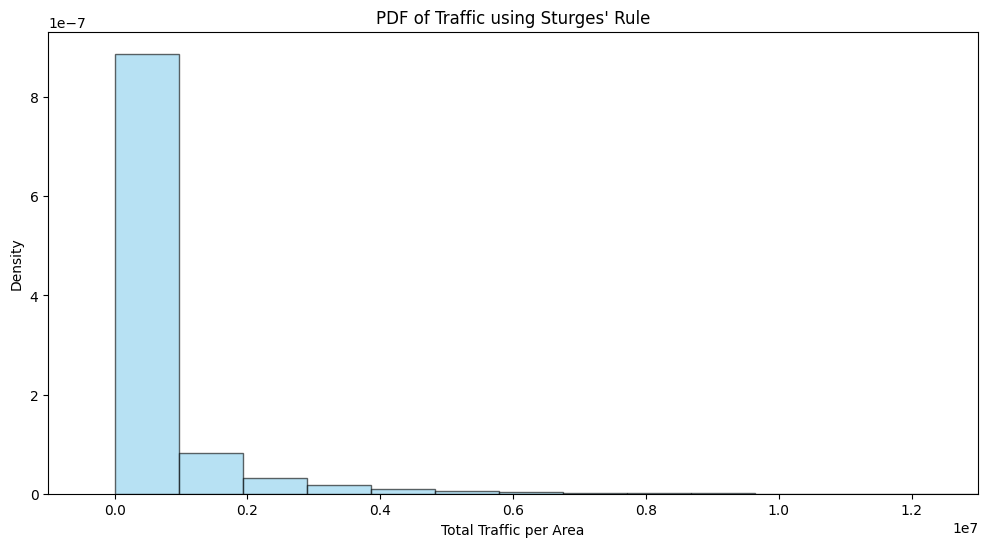

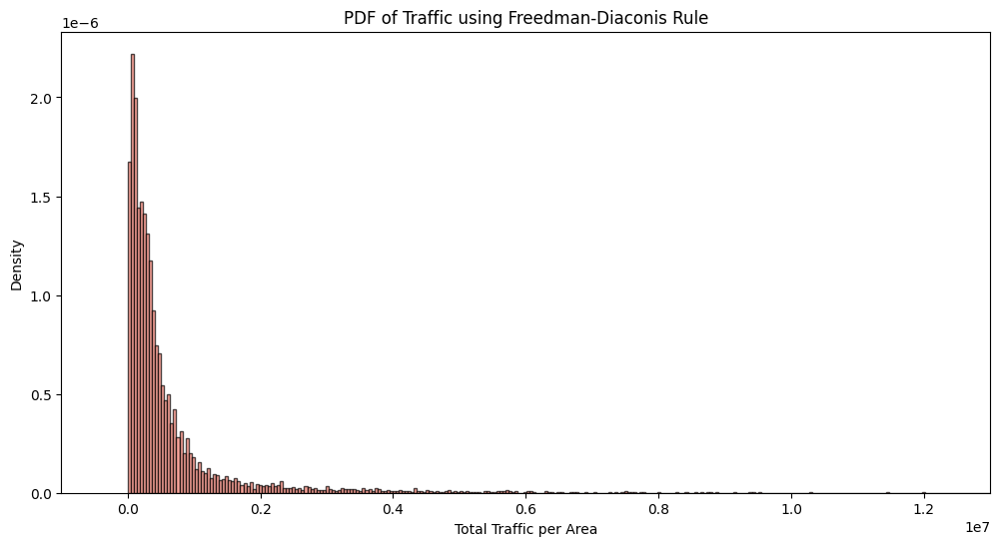

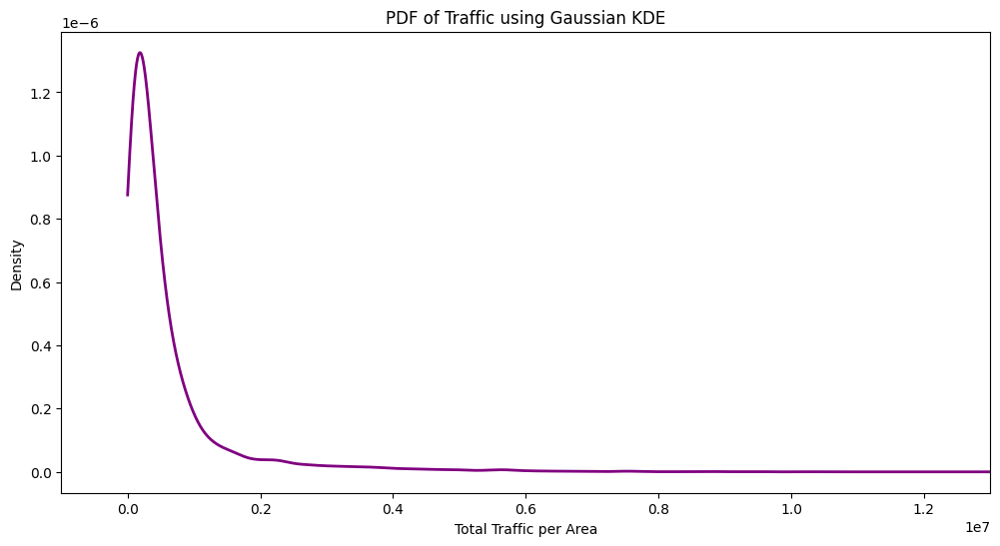

In [ ]:


# Calculate the total internet traffic per area
total_traffic_per_cell = df.groupby('square_id')['internet_traffic'].sum().reset_index()
traffic_values = total_traffic_per_cell['internet_traffic']

# Plotting Sturges' Rule Histogram
n = len(traffic_values)
sturges_bins = int(np.ceil(np.log2(n)))  # Number of bins with Sturges' rule

plt.figure(figsize=(12, 6))
plt.hist(traffic_values, bins=sturges_bins, density=True, alpha=0.6, color='skyblue', edgecolor='black')
plt.xlabel('Total Traffic per Area')
plt.ylabel('Density')
plt.title("PDF of Traffic using Sturges' Rule")
plt.xlim([-0.1*1e7, 1.3*1e7])
plt.show()


# Plotting Freedman-Diaconis Rule Histogram
iqr = traffic_values.quantile(0.75) - traffic_values.quantile(0.25)
fd_bin_width = 2 * iqr / (n ** (1/3))
fd_bins = int((traffic_values.max() - traffic_values.min()) / fd_bin_width)

plt.figure(figsize=(12, 6))
plt.hist(traffic_values, bins=fd_bins, density=True, alpha=0.7, color='salmon', edgecolor='black')
plt.xlabel('Total Traffic per Area')
plt.ylabel('Density')
plt.title("PDF of Traffic using Freedman-Diaconis Rule")
plt.xlim([-0.1*1e7, 1.3*1e7])
plt.show()

# Gaussian KDE Plot
kde_density = gaussian_kde(traffic_values)
x_vals = np.linspace(traffic_values.min(), traffic_values.max(), 2000)

plt.figure(figsize=(12, 6))
plt.plot(x_vals, kde_density(x_vals), color='purple', linewidth=2)
plt.xlabel('Total Traffic per Area')
plt.ylabel('Density')
plt.title("PDF of Traffic using Gaussian KDE")
plt.xlim([-0.1*1e7, 1.3*1e7])
plt.show()



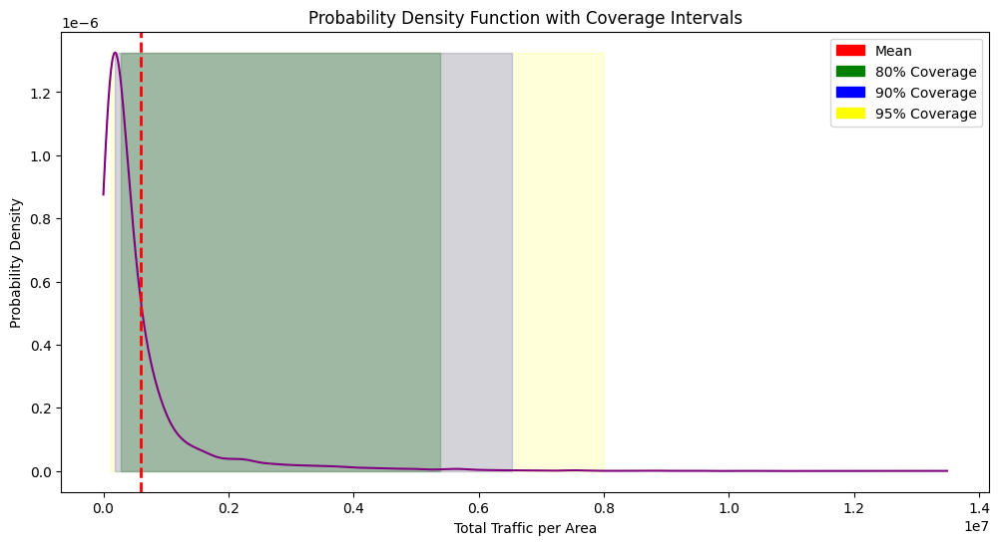

In [ ]:
traffic_values = total_traffic_per_cell['internet_traffic']
density = gaussian_kde(traffic_values)
x_vals = np.linspace(traffic_values.min(), traffic_values.max(), 2000)

# Plot the KDE
plt.figure(figsize=(12, 6))
plt.plot(x_vals, density(x_vals), label='KDE', color='purple')
plt.xlabel('Total Traffic per Area')
plt.ylabel('Probability Density')
plt.title('Probability Density Function with Coverage Intervals')

# Calculate mean and percentiles for coverage intervals
mean_traffic = traffic_values.mean()
sorted_traffic = np.sort(traffic_values)

# Calculate cumulative distribution
cumulative_traffic = np.cumsum(sorted_traffic) / sorted_traffic.sum()

# 80% coverage interval
lower_bound_80 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.10)]
upper_bound_80 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.90)]
plt.fill_betweenx([0, density(x_vals).max()], lower_bound_80, upper_bound_80, color='green', alpha=0.3)

# 90% coverage interval
lower_bound_90 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.05)]
upper_bound_90 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.95)]
plt.fill_betweenx([0, density(x_vals).max()], lower_bound_90, upper_bound_90, color='blue', alpha=0.2)

# 95% coverage interval
lower_bound_95 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.025)]
upper_bound_95 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.975)]
plt.fill_betweenx([0, density(x_vals).max()], lower_bound_95, upper_bound_95, color='yellow', alpha=0.15)

# Plot mean line
plt.axvline(mean_traffic, color='red', linestyle='--', linewidth=2)

# Legend for coverage intervals and mean line
red_patch = mpatches.Patch(color='red', label='Mean')
green_patch = mpatches.Patch(color='green', label='80% Coverage')
blue_patch = mpatches.Patch(color='blue', label='90% Coverage')
yellow_patch = mpatches.Patch(color='yellow', label='95% Coverage')
plt.legend(handles=[red_patch, green_patch, blue_patch, yellow_patch])

# Show plot
plt.show()


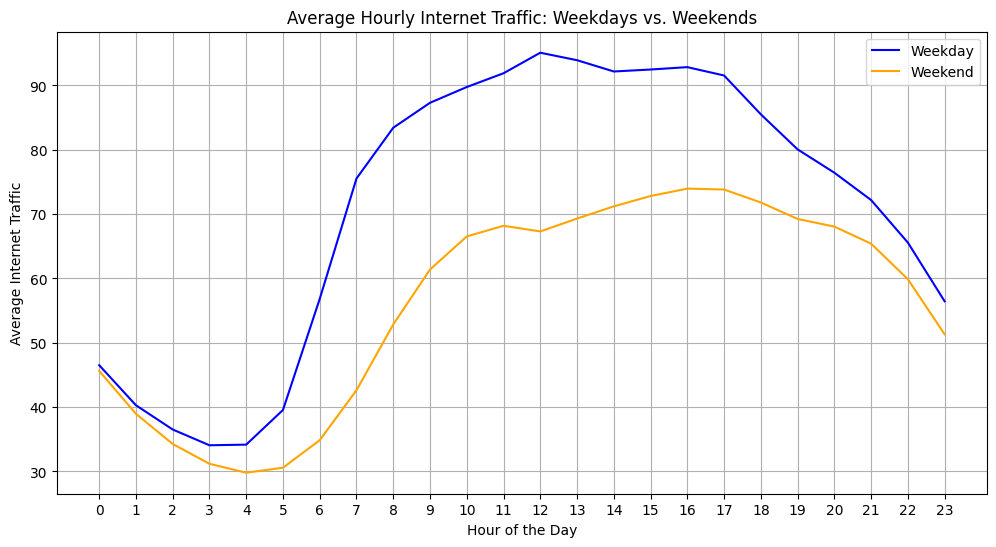

In [ ]:
df['time_interval'] = pd.to_datetime(df['time_interval'])
df['hour'] = df['time_interval'].dt.hour
df['day_of_week'] = df['time_interval'].dt.dayofweek

# Determine whether each entry is a weekday or weekend
df['is_weekend'] = df['day_of_week'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Aggregate to calculate average traffic per hour for weekdays and weekends
hourly_traffic = df.groupby(['hour', 'is_weekend'])['internet_traffic'].mean().reset_index()

# Separate data for plotting
weekday_traffic = hourly_traffic[hourly_traffic['is_weekend'] == 'Weekday']
weekend_traffic = hourly_traffic[hourly_traffic['is_weekend'] == 'Weekend']

# Plot the hourly traffic trends
plt.figure(figsize=(12, 6))
plt.plot(weekday_traffic['hour'], weekday_traffic['internet_traffic'], label='Weekday', color='blue')
plt.plot(weekend_traffic['hour'], weekend_traffic['internet_traffic'], label='Weekend', color='orange')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Internet Traffic')
plt.title('Average Hourly Internet Traffic: Weekdays vs. Weekends')
plt.xticks(range(0, 24))
plt.legend()
plt.grid(True)
plt.show()


<ipython-input-31-e39e12999e89>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hour'] = filtered_df['time_interval'].dt.hour
<ipython-input-31-e39e12999e89>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['date'] = filtered_df['time_interval'].dt.date


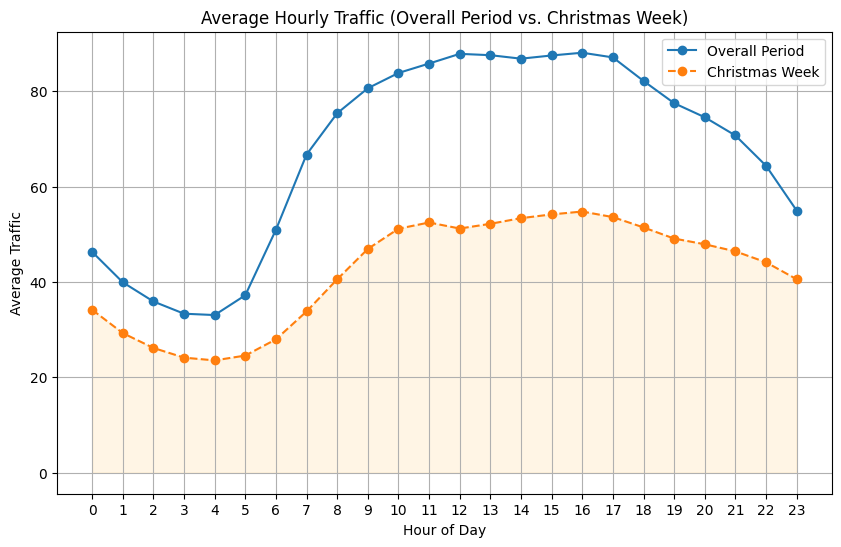

In [ ]:

start_datetime = "2013-10-31 23:00:00"
end_datetime = "2013-12-31 23:59:59"
christmas_start = "2013-12-24 00:00:00"
christmas_end = "2013-12-31 23:59:59"

# Filter data for the specified datetime range
filtered_df = df[(df['time_interval'] >= start_datetime) & (df['time_interval'] <= end_datetime)]

# Extract the hour and day for grouping
filtered_df['hour'] = filtered_df['time_interval'].dt.hour
filtered_df['date'] = filtered_df['time_interval'].dt.date

# Calculate the mean traffic for each hour across the entire period
hourly_traffic = filtered_df.groupby('hour')['internet_traffic'].mean().reset_index()

# Calculate average traffic specifically for Christmas week
christmas_df = filtered_df[(filtered_df['time_interval'] >= christmas_start) & (filtered_df['time_interval'] <= christmas_end)]
hourly_christmas_traffic = christmas_df.groupby('hour')['internet_traffic'].mean().reset_index()

# Plot the hourly traffic
plt.figure(figsize=(10, 6))
plt.plot(hourly_traffic['hour'], hourly_traffic['internet_traffic'], marker='o', label='Overall Period')
plt.plot(hourly_christmas_traffic['hour'], hourly_christmas_traffic['internet_traffic'], marker='o', linestyle='--', label='Christmas Week')
plt.title("Average Hourly Traffic (Overall Period vs. Christmas Week)")
plt.xlabel("Hour of Day")
plt.ylabel("Average Traffic")
plt.xticks(range(0, 24))
plt.legend()
plt.grid(True)
plt.fill_between(hourly_christmas_traffic['hour'], hourly_christmas_traffic['internet_traffic'], color='orange', alpha=0.1)

plt.show()


In [ ]:
start_date = df['time_interval'].min()
two_weeks_data = df[(df['time_interval'] >= start_date) &
                      (df['time_interval'] < start_date + pd.Timedelta(weeks=2))]

# Identify the area with the highest traffic
top_area = total_traffic_per_cell.loc[total_traffic_per_cell['internet_traffic'].idxmax(), 'square_id']

In [ ]:
top_area

5161

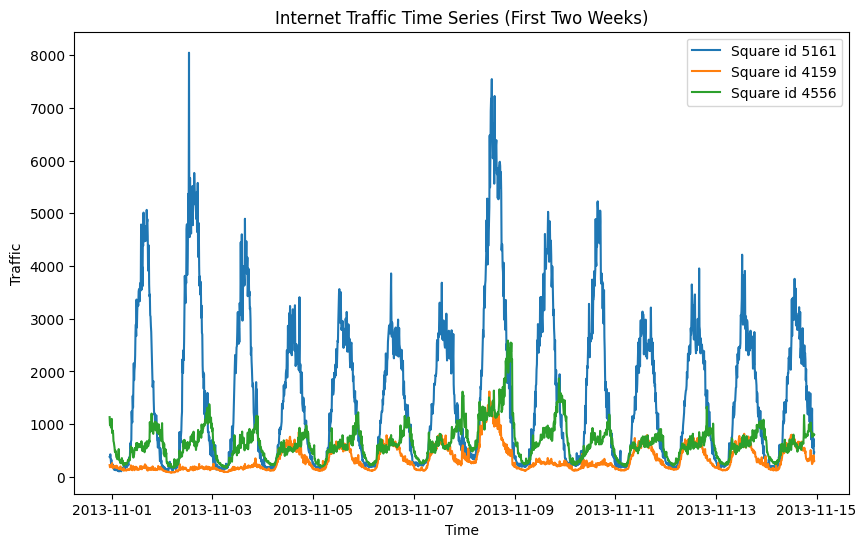

In [ ]:
areas_to_plot = [top_area, 4159, 4556]
time_series_data = two_weeks_data[two_weeks_data['square_id'].isin(areas_to_plot)]

# Plot the time series
plt.figure(figsize=(10, 6))
for area_id in areas_to_plot:
    area_data = time_series_data[time_series_data['square_id'] == area_id]
    plt.plot(area_data['time_interval'], area_data['internet_traffic'], label=f'Square id {area_id}')

plt.title('Internet Traffic Time Series (First Two Weeks)')
plt.xlabel('Time')
plt.ylabel('Traffic')
plt.legend()
plt.show()

In [ ]:
square_ids_to_plot = [top_area, 4159, 4556]
filtered_gdf = gdf[gdf['cellId'].isin(square_ids_to_plot)]

# Calculate the centroid of the selected squares for map centering
centroid = filtered_gdf.geometry.unary_union.centroid
map_center = [centroid.y, centroid.x]

# Initialize the map centered on the selected squares with a higher zoom level
map_zoomed = folium.Map(location=map_center, zoom_start=16)

# Add each square to the map with a label
for _, row in filtered_gdf.iterrows():
    # Add the square geometry to the map
    folium.GeoJson(
        row['geometry'],
        name=f"Square ID {row['cellId']}"
    ).add_to(map_zoomed)

    # Calculate the centroid of each square for label positioning
    square_centroid = row['geometry'].centroid
    folium.Marker(
        location=[square_centroid.y, square_centroid.x],
        icon=folium.DivIcon(html=f"""<div style="font-size: 12px; color: black;">
                                      {row['cellId']}</div>""")
    ).add_to(map_zoomed)

# Display the map
map_zoomed

<ipython-input-35-82c92ad71110>:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = filtered_gdf.geometry.unary_union.centroid


In [ ]:
total_traffic_per_area = df.groupby('square_id')['internet_traffic'].sum().reset_index()

# Sort by internet traffic in descending order to find the top areas
top_areas = total_traffic_per_area.sort_values(by='internet_traffic', ascending=False).head(10)


print("Top 10 areas with the highest total traffic:")
print(top_areas)


Top 10 areas with the highest total traffic:
      square_id  internet_traffic
5160       5161      1.348949e+07
5058       5059      1.197819e+07
5258       5259      1.144482e+07
5060       5061      1.030696e+07
5257       5258      9.498652e+06
5158       5159      9.437481e+06
6063       6064      9.399213e+06
4854       4855      9.170492e+06
4855       4856      8.866177e+06
5261       5262      8.765110e+06


In [ ]:
square_ids_to_plot = [5059, 5259, 5061, 5258, 5161, 5159, 6064, 4855, 4856, 5262]
filtered_gdf = gdf[gdf['cellId'].isin(square_ids_to_plot)]

# Calculate the centroid of the selected squares for map centering
centroid = filtered_gdf.geometry.unary_union.centroid
map_center = [centroid.y, centroid.x]

# Initialize the map centered on the selected squares with a higher zoom level
map_zoomed = folium.Map(location=map_center, zoom_start=16)

# Add each square to the map with a label
for _, row in filtered_gdf.iterrows():
    # Add the square geometry to the map
    folium.GeoJson(
        row['geometry'],
        name=f"Square ID {row['cellId']}"
    ).add_to(map_zoomed)

    # Calculate the centroid of each square for label positioning
    square_centroid = row['geometry'].centroid
    folium.Marker(
        location=[square_centroid.y, square_centroid.x],
        icon=folium.DivIcon(html=f"""<div style="font-size: 12px; color: black;">
                                      {row['cellId']}</div>""")
    ).add_to(map_zoomed)

# Display the map
map_zoomed

<ipython-input-37-9bfc5c8ced1e>:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = filtered_gdf.geometry.unary_union.centroid


In [ ]:
# Aggregate total internet traffic per area
total_traffic_per_area = df.groupby('square_id')['internet_traffic'].sum().reset_index()

# Sort by internet traffic in ascending order to find the top areas
low_10 = total_traffic_per_area.sort_values(by='internet_traffic', ascending=np.True_).head(10)

print("10 areas with the lowest total traffic:")
print(low_10)


10 areas with the lowest total traffic:
      square_id  internet_traffic
5238       5239        226.486230
5338       5339        736.752410
2800       2801       2938.110593
5237       5238       3297.373102
111         112       3770.238921
1206       1207       5825.234425
5337       5338       7696.129817
2900       2901      12668.880545
5309       5310      13826.428724
5209       5210      13857.355342


In [ ]:
square_ids_to_plot = [5239, 5339, 2801, 5238, 112, 1207, 5338, 2901, 5310, 5210]
filtered_gdf = gdf[gdf['cellId'].isin(square_ids_to_plot)]

# Calculate the centroid of the selected squares for map centering
centroid = filtered_gdf.geometry.unary_union.centroid
map_center = [centroid.y, centroid.x]

# Initialize the map centered on the selected squares with a higher zoom level
map_zoomed = folium.Map(location=map_center, zoom_start=16)

# Add each square to the map with a label
for _, row in filtered_gdf.iterrows():
    # Add the square geometry to the map
    folium.GeoJson(
        row['geometry'],
        name=f"Square ID {row['cellId']}"
    ).add_to(map_zoomed)

    # Calculate the centroid of each square for label positioning
    square_centroid = row['geometry'].centroid
    folium.Marker(
        location=[square_centroid.y, square_centroid.x],
        icon=folium.DivIcon(html=f"""<div style="font-size: 12px; color: black;">
                                      {row['cellId']}</div>""")
    ).add_to(map_zoomed)

# Display the map
map_zoomed

<ipython-input-39-afc936750b28>:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = filtered_gdf.geometry.unary_union.centroid


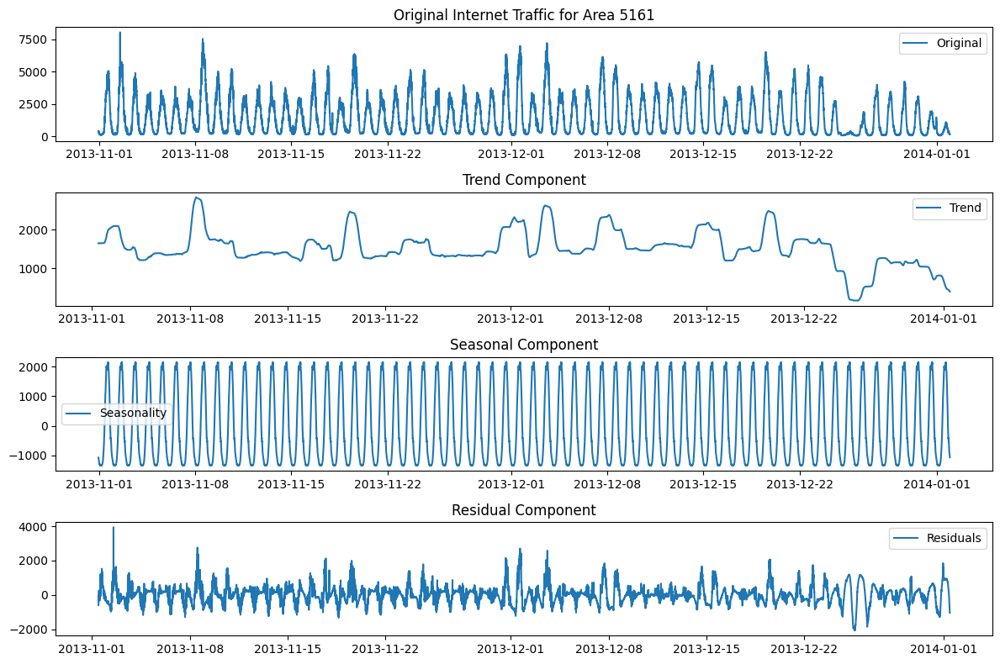

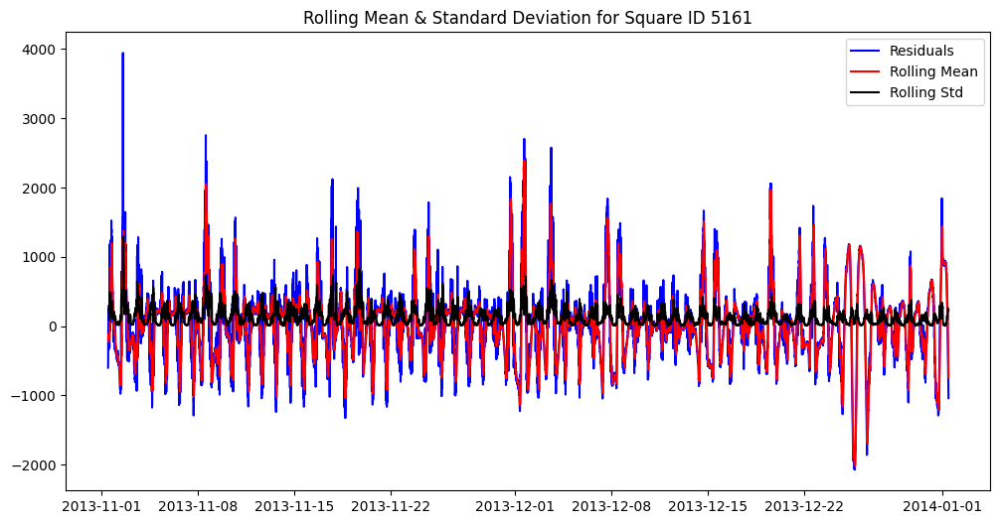

Results of Dickey-Fuller Test for Square ID 5161:
Test Statistic                -1.821704e+01
p-value                        2.384934e-30
#Lags Used                     3.700000e+01
Number of Observations Used    8.746000e+03
Critical Value 1%             -3.431098e+00
Critical Value 5%             -2.861871e+00
Critical Value 10%            -2.566946e+00
dtype: float64


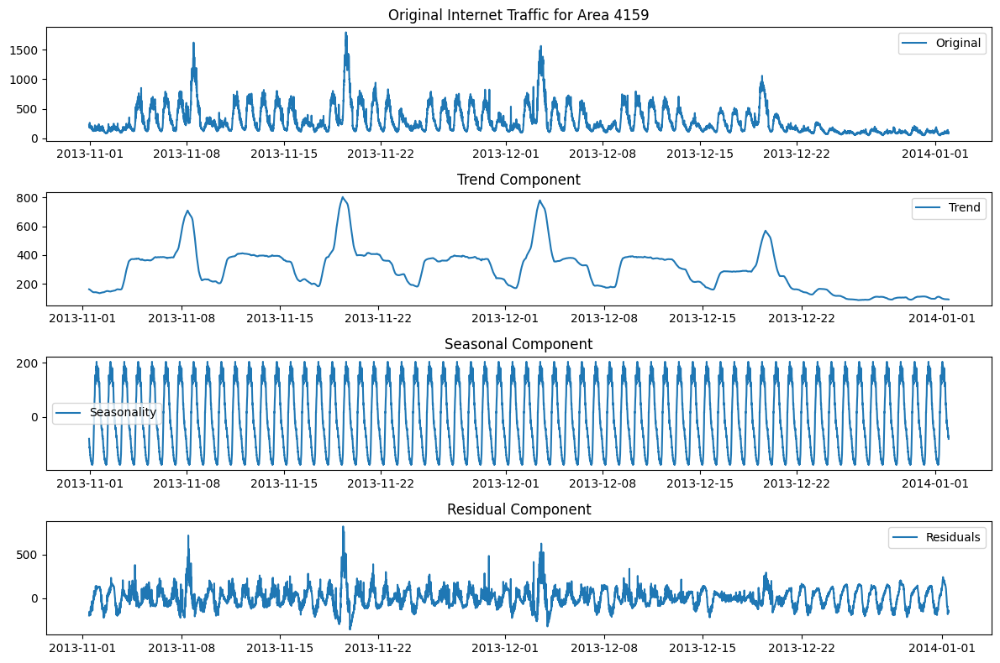

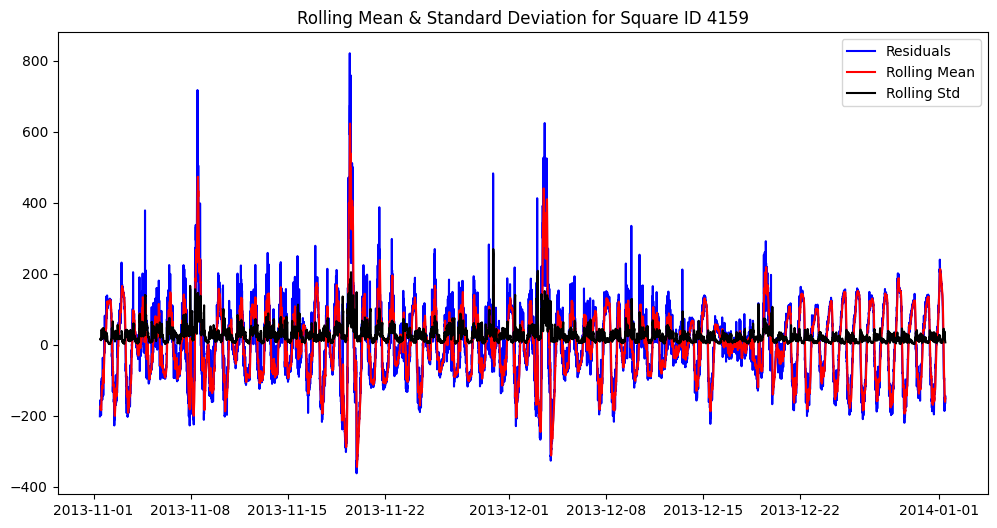

Results of Dickey-Fuller Test for Square ID 4159:
Test Statistic                  -18.974011
p-value                           0.000000
#Lags Used                       37.000000
Number of Observations Used    8746.000000
Critical Value 1%                -3.431098
Critical Value 5%                -2.861871
Critical Value 10%               -2.566946
dtype: float64


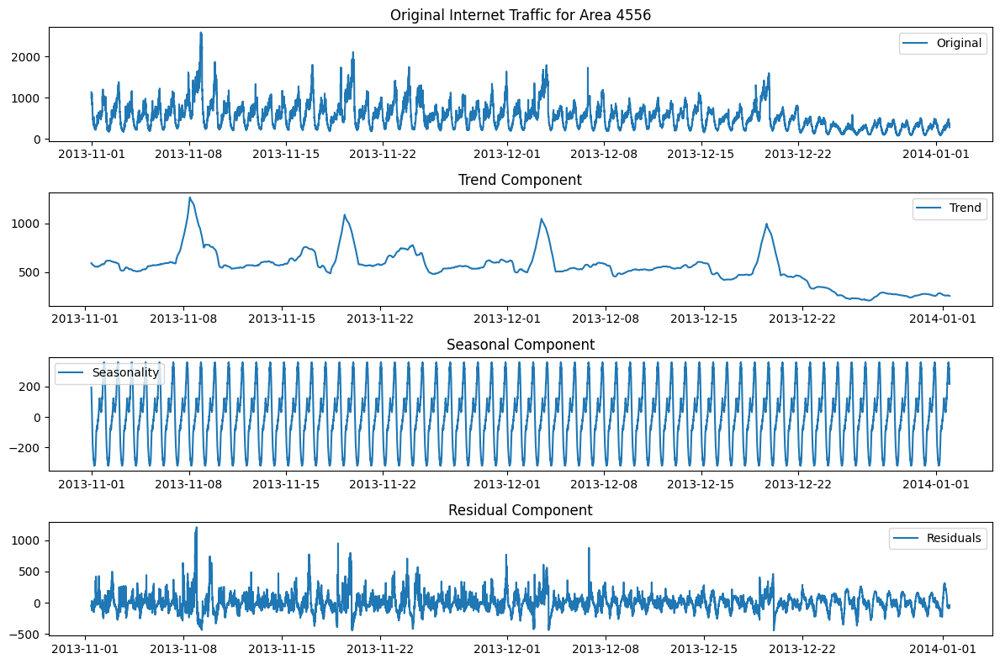

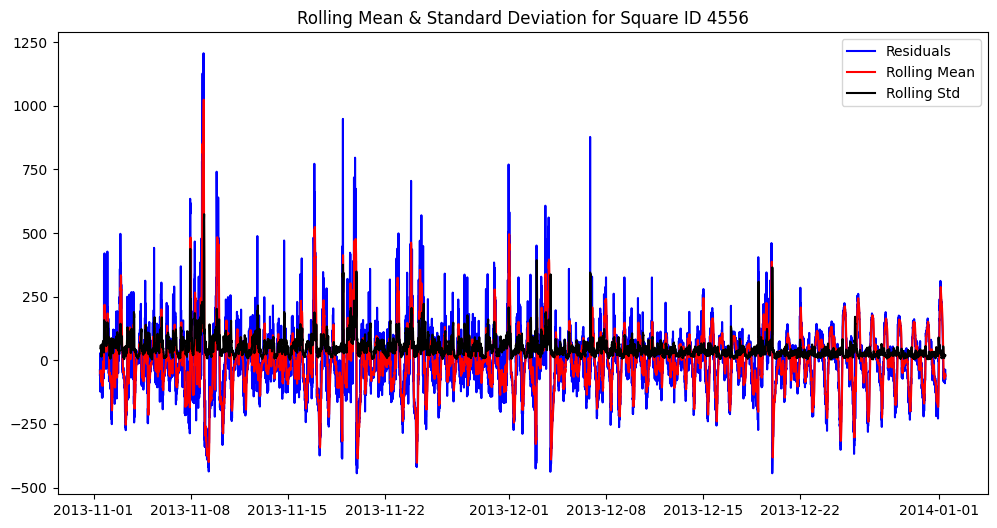

Results of Dickey-Fuller Test for Square ID 4556:
Test Statistic                -1.696755e+01
p-value                        9.210237e-30
#Lags Used                     3.700000e+01
Number of Observations Used    8.746000e+03
Critical Value 1%             -3.431098e+00
Critical Value 5%             -2.861871e+00
Critical Value 10%            -2.566946e+00
dtype: float64


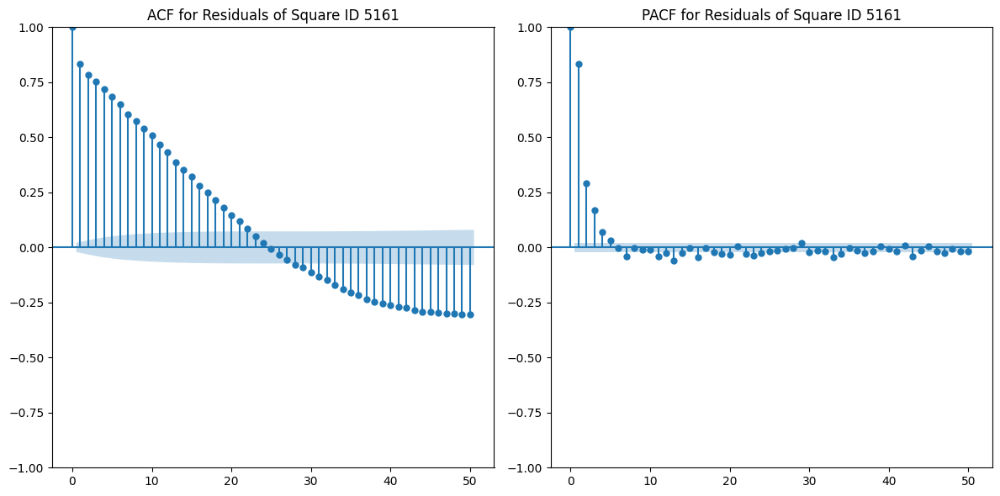

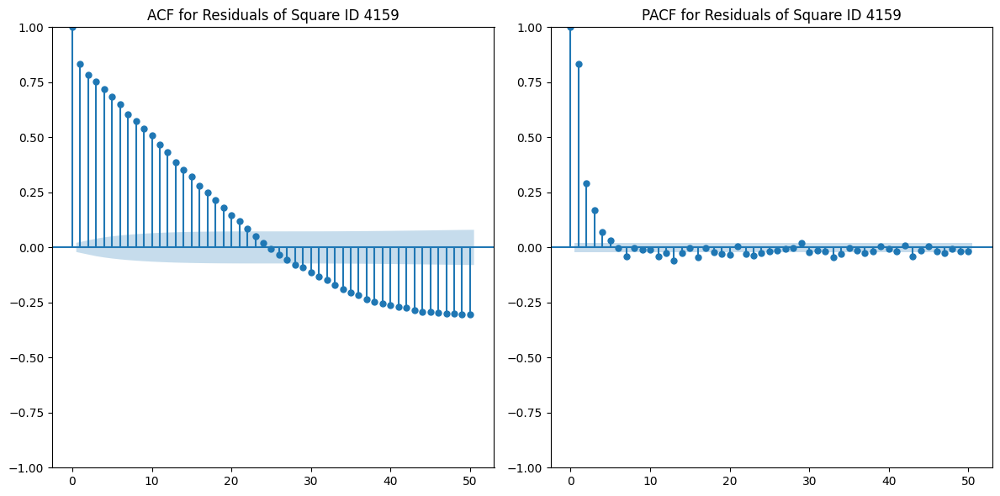

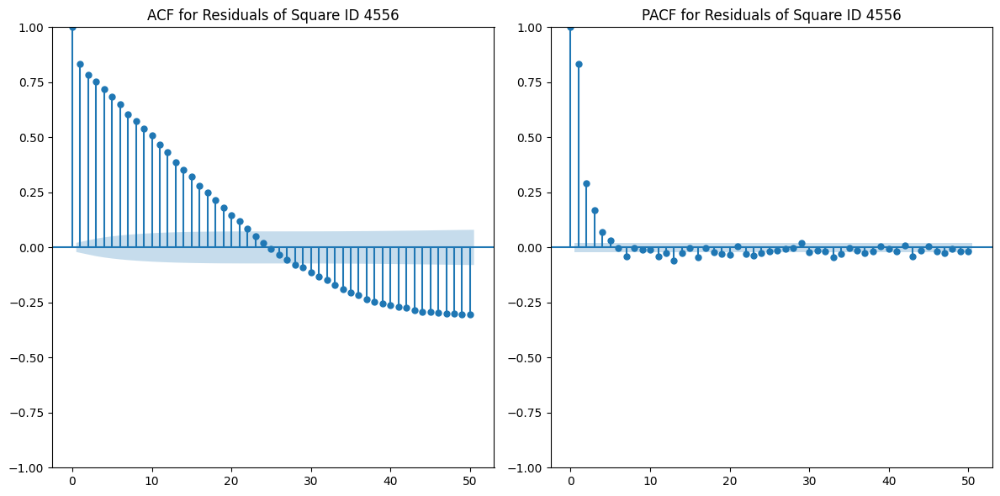

In [7]:
# Define the square_ids to analyze
square_ids = [5161, 4159, 4556]

# Define function for plotting and testing stationarity
def plt_and_test_stationarity(timeseries, square_id, label='Original'):
    
    rolmean = timeseries.rolling(window=7).mean() 
    rolstd = timeseries.rolling(window=7).std()  

    # Plot original data with rolling mean and std
    plt.figure(figsize=(12, 6))
    plt.plot(timeseries, color='blue', label=label)
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title(f'Rolling Mean & Standard Deviation for Square ID {square_id}')
    plt.show()

    # Perform Dickey-Fuller test
    print(f'Results of Dickey-Fuller Test for Square ID {square_id}:')
    dftest = adfuller(timeseries.dropna())
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value {key}'] = value
    print(dfoutput)

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(residuals, square_id):
    # Plot ACF and PACF of residuals
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plot_acf(residuals.dropna(), ax=plt.gca(), lags=50)
    plt.title(f'ACF for Residuals of Square ID {square_id}')

    plt.subplot(122)
    plot_pacf(residuals.dropna(), ax=plt.gca(), lags=50)
    plt.title(f'PACF for Residuals of Square ID {square_id}')

    plt.tight_layout()
    plt.show()

# Decompose time series and apply Dickey-Fuller test on residuals
for square_id in square_ids:
    timeseries = df[df['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries['time_interval'] = pd.to_datetime(timeseries['time_interval'])
    timeseries.set_index('time_interval', inplace=True)

    # Decompose the time series (seasonality can still be set based on observed patterns)
    decomposition = seasonal_decompose(timeseries['internet_traffic'], model='additive', period=144)  # Assuming a daily cycle, 144 intervals for 10-minute data

    # Plot the decomposed components
    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(timeseries['internet_traffic'], label='Original')
    plt.title(f'Original Internet Traffic for Area {square_id}')
    plt.legend(loc='best')

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend')
    plt.title('Trend Component')
    plt.legend(loc='best')

    plt.subplot(413)
    plt.plot(decomposition.seasonal, label='Seasonality')
    plt.title('Seasonal Component')
    plt.legend(loc='best')

    plt.subplot(414)
    plt.plot(decomposition.resid, label='Residuals')
    plt.title('Residual Component')
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

    # Get residuals and test stationarity
    residuals = decomposition.resid
    plt_and_test_stationarity(residuals, square_id, label='Residuals')

for square_id in square_ids:
    residuals = decomposition.resid
    plot_acf_pacf(residuals, square_id)

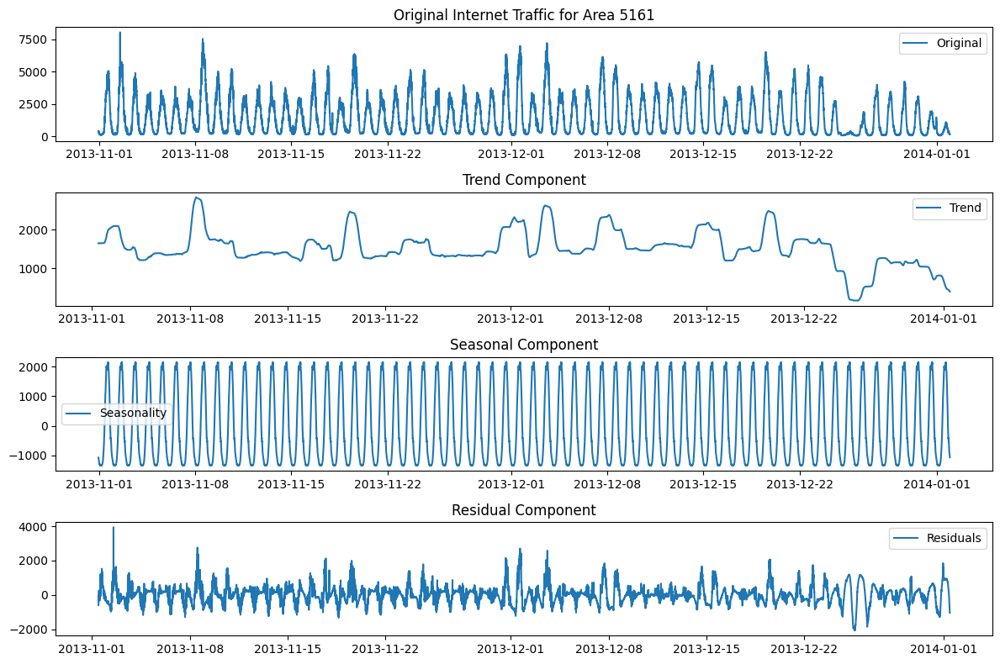

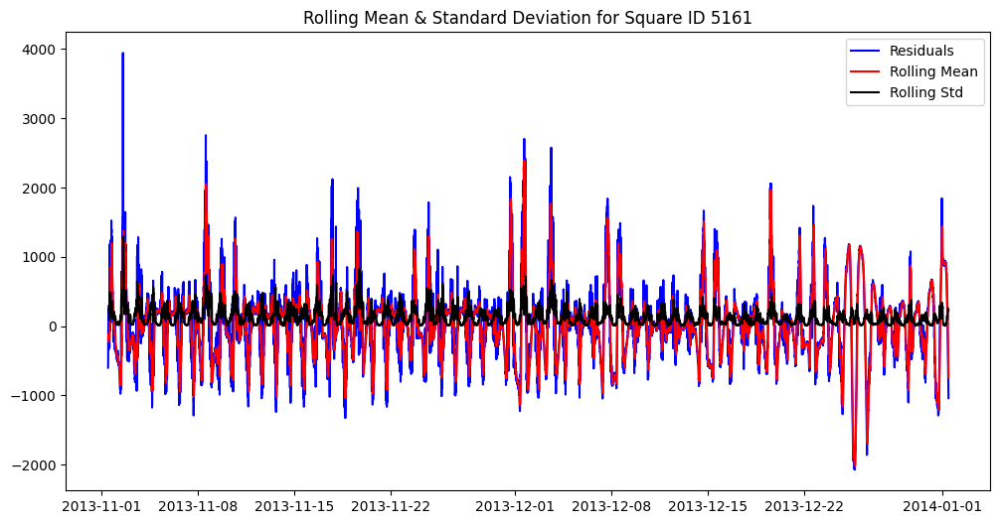

Results of Dickey-Fuller Test for Square ID 5161:
Test Statistic                -1.821704e+01
p-value                        2.384934e-30
#Lags Used                     3.700000e+01
Number of Observations Used    8.746000e+03
Critical Value 1%             -3.431098e+00
Critical Value 5%             -2.861871e+00
Critical Value 10%            -2.566946e+00
dtype: float64


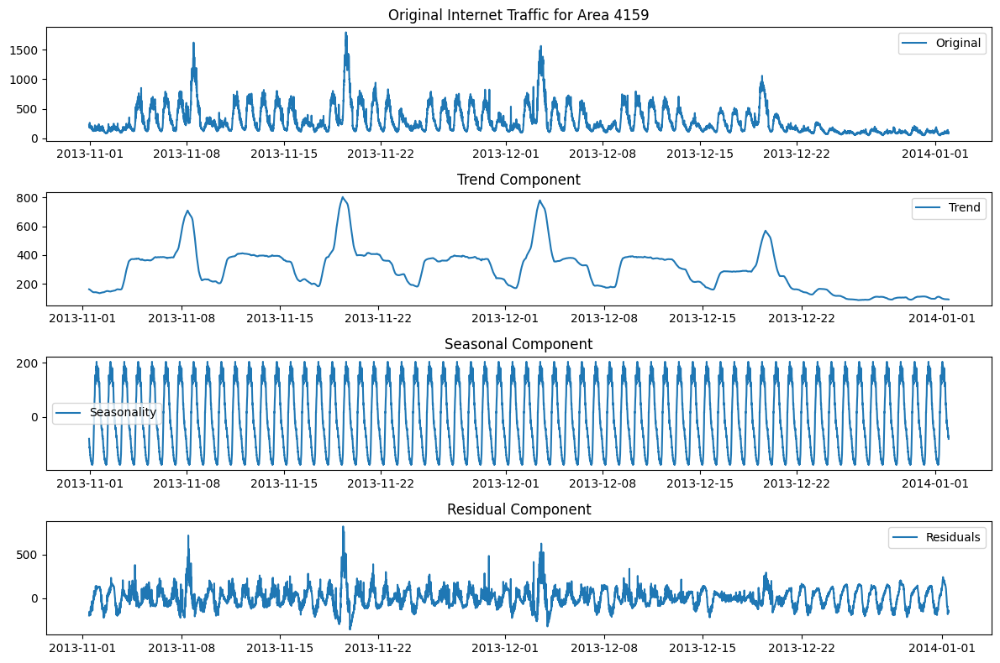

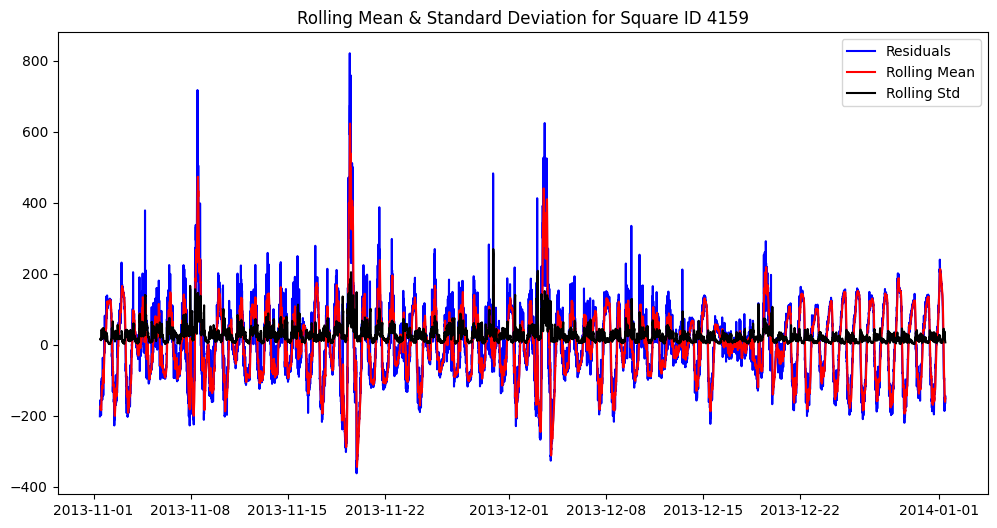

Results of Dickey-Fuller Test for Square ID 4159:
Test Statistic                  -18.974011
p-value                           0.000000
#Lags Used                       37.000000
Number of Observations Used    8746.000000
Critical Value 1%                -3.431098
Critical Value 5%                -2.861871
Critical Value 10%               -2.566946
dtype: float64


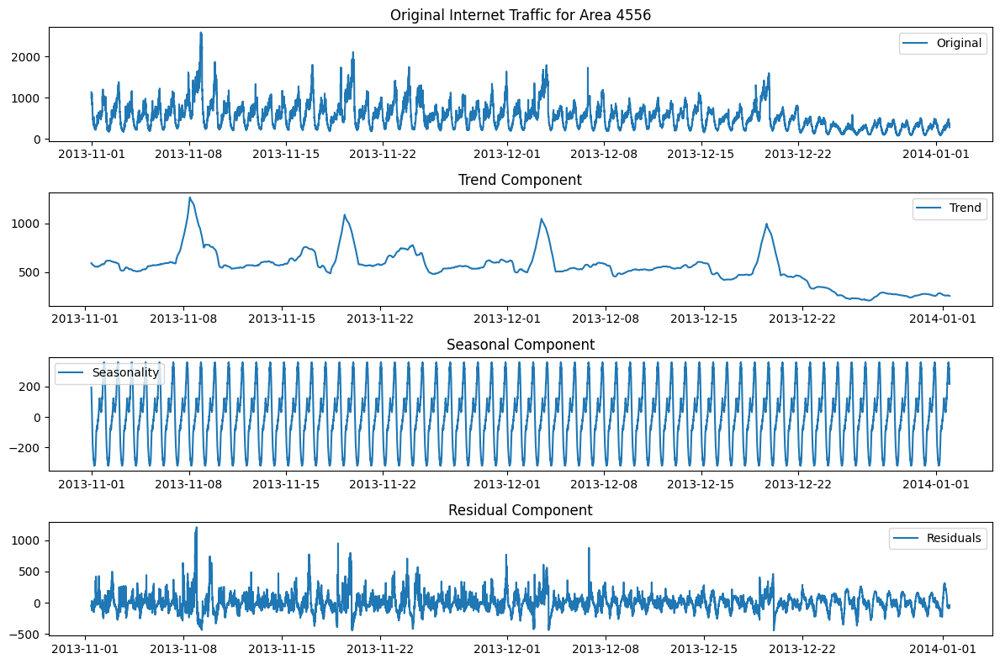

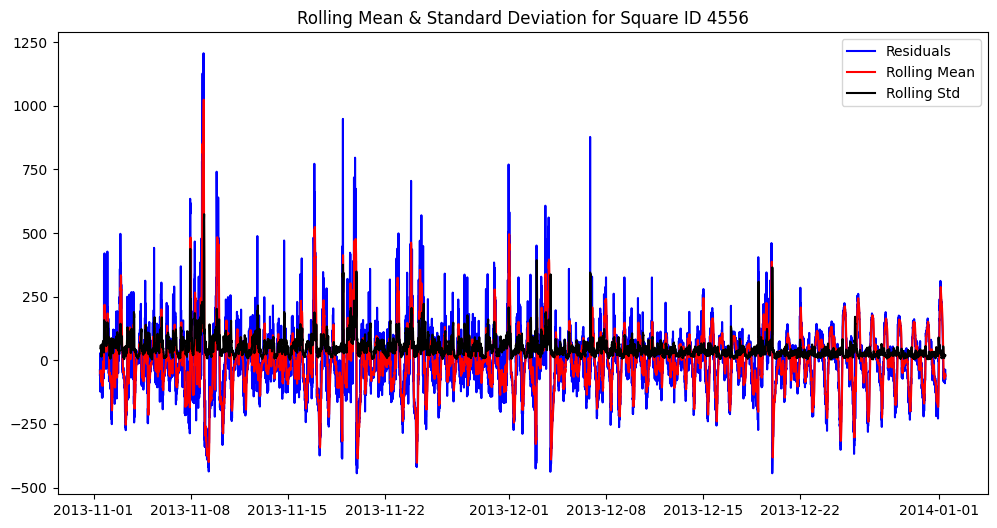

Results of Dickey-Fuller Test for Square ID 4556:
Test Statistic                -1.696755e+01
p-value                        9.210237e-30
#Lags Used                     3.700000e+01
Number of Observations Used    8.746000e+03
Critical Value 1%             -3.431098e+00
Critical Value 5%             -2.861871e+00
Critical Value 10%            -2.566946e+00
dtype: float64


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10min will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10min will be used.
  self._init_dates(dates, freq)


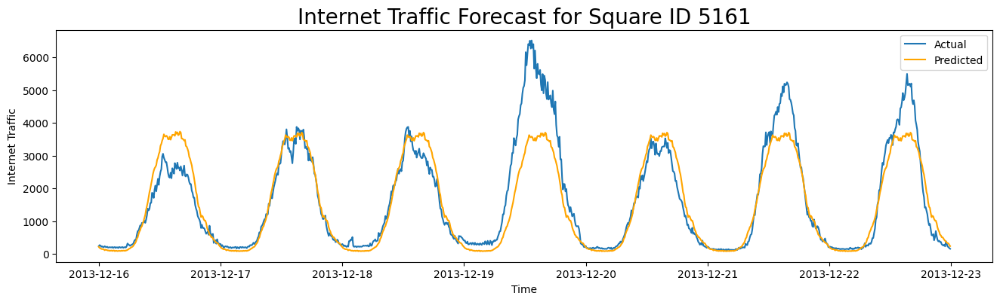

SARIMA MAE for Square ID 5161: 383.62895293370326
SARIMA MAPE for Square ID 5161: 30.43%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10min will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10min will be used.
  self._init_dates(dates, freq)


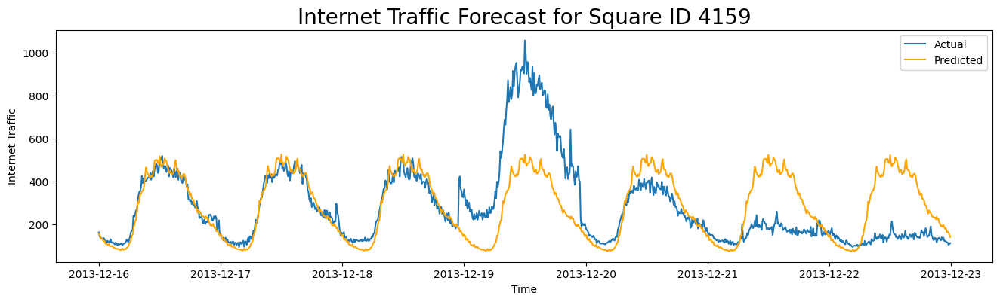

SARIMA MAE for Square ID 4159: 102.44356106362547
SARIMA MAPE for Square ID 4159: 43.15%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10min will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10min will be used.
  self._init_dates(dates, freq)


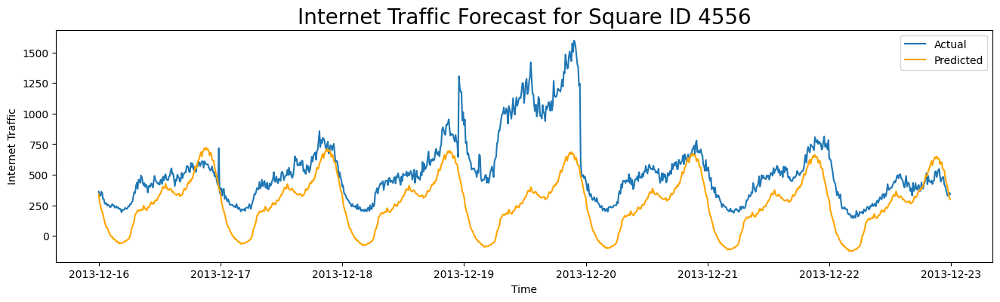

SARIMA MAE for Square ID 4556: 265.5754344612696
SARIMA MAPE for Square ID 4556: 56.92%


In [ ]:


# Define the square_ids to analyze
square_ids = [5161, 4159, 4556]

# Define function for plotting and testing stationarity
def plt_and_test_stationarity(timeseries, square_id, label='Original'):
    rolmean = timeseries.rolling(window=7).mean()  
    rolstd = timeseries.rolling(window=7).std()  


    plt.figure(figsize=(12, 6))
    plt.plot(timeseries, color='blue', label=label)
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title(f'Rolling Mean & Standard Deviation for Square ID {square_id}')
    plt.show()

    # Perform Dickey-Fuller test
    print(f'Results of Dickey-Fuller Test for Square ID {square_id}:')
    dftest = adfuller(timeseries.dropna())
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value {key}'] = value
    print(dfoutput)

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(residuals, square_id):
    # Plot ACF and PACF of residuals
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plot_acf(residuals.dropna(), ax=plt.gca(), lags=50)
    plt.title(f'ACF for Residuals of Square ID {square_id}')

    plt.subplot(122)
    plot_pacf(residuals.dropna(), ax=plt.gca(), lags=50)
    plt.title(f'PACF for Residuals of Square ID {square_id}')

    plt.tight_layout()
    plt.show()

# Decompose time series and apply Dickey-Fuller test on residuals
for square_id in square_ids:
    timeseries = df[df['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries['time_interval'] = pd.to_datetime(timeseries['time_interval'])
    timeseries.set_index('time_interval', inplace=True)

    # Decompose the time series (seasonality can still be set based on observed patterns)
    decomposition = seasonal_decompose(timeseries['internet_traffic'], model='additive', period=144)  # Assuming a daily cycle, 144 intervals for 10-minute data

    # Plot the decomposed components
    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(timeseries['internet_traffic'], label='Original')
    plt.title(f'Original Internet Traffic for Area {square_id}')
    plt.legend(loc='best')

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend')
    plt.title('Trend Component')
    plt.legend(loc='best')

    plt.subplot(413)
    plt.plot(decomposition.seasonal, label='Seasonality')
    plt.title('Seasonal Component')
    plt.legend(loc='best')

    plt.subplot(414)
    plt.plot(decomposition.resid, label='Residuals')
    plt.title('Residual Component')
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

    # Get residuals and test stationarity
    residuals = decomposition.resid
    plt_and_test_stationarity(residuals, square_id, label='Residuals')

for square_id in square_ids:
    residuals = decomposition.resid
    plot_acf_pacf(residuals, square_id)

# Define training and test periods
train_end_date = '2013-12-15 23:59:59'
forecast_start_date = '2013-12-16 00:00:00'
forecast_end_date = '2013-12-22 23:59:59'

# SARIMA model training and evaluation
for square_id in square_ids:
    timeseries = df[df['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries['time_interval'] = pd.to_datetime(timeseries['time_interval'])
    timeseries.set_index('time_interval', inplace=True)

    # Split data into train and test sets
    train = timeseries[:train_end_date]
    test = timeseries[forecast_start_date:forecast_end_date]

    # Define SARIMA parameters
    order = (1, 1, 1)
    seasonal_order = (1, 1, 1, 144)

    # Define SARIMAX model
    sarima_model = SARIMAX(train['internet_traffic'], order=order, seasonal_order=seasonal_order)
    sarima_model_fit = sarima_model.fit(disp=False)

    # Make predictions
    predictions = sarima_model_fit.predict(start=forecast_start_date, end=forecast_end_date)

    # Align predictions with test set using their index (time_interval)
    predictions = predictions.loc[test.index]  # Align predictions with test set

    # Plot actual vs predicted values starting and ending with the prediction period
    plt.figure(figsize=(16, 4))
    plt.plot(test.index, test['internet_traffic'], label="Actual")
    plt.plot(predictions, label="Predicted", color='orange')
    plt.title(f'Internet Traffic Forecast for Square ID {square_id}', fontsize=20)
    plt.xlabel('Time')
    plt.ylabel('Internet Traffic')
    plt.legend()
    plt.show()

    # Calculate and print evaluation metrics
    mae = mean_absolute_error(test['internet_traffic'], predictions)
    mape = mean_absolute_percentage_error(test['internet_traffic'], predictions)
    print(f"SARIMA MAE for Square ID {square_id}: {mae}")
    print(f"SARIMA MAPE for Square ID {square_id}: {mape * 100:.2f}%")


<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning:

Optimal K for Square ID 5161: 7
MAE: 107.52301039662636
MAPE: 9.832140303714231%


<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step


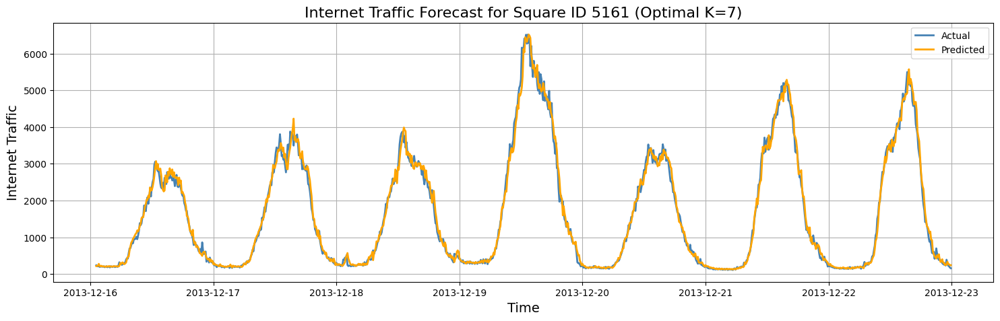

<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning:

Optimal K for Square ID 4159: 4
MAE: 22.66091631282308
MAPE: 8.220850405127985%


<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step


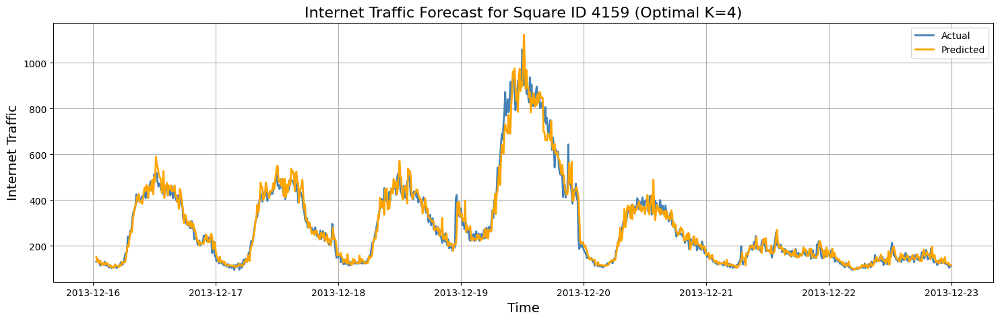

<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step
<ipython-input-6-d130c873073b>:30: FutureWarning:

Optimal K for Square ID 4556: 8
MAE: 41.10965258712518
MAPE: 8.298329884780486%


<ipython-input-6-d130c873073b>:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(data[i])  # Target: the next time step


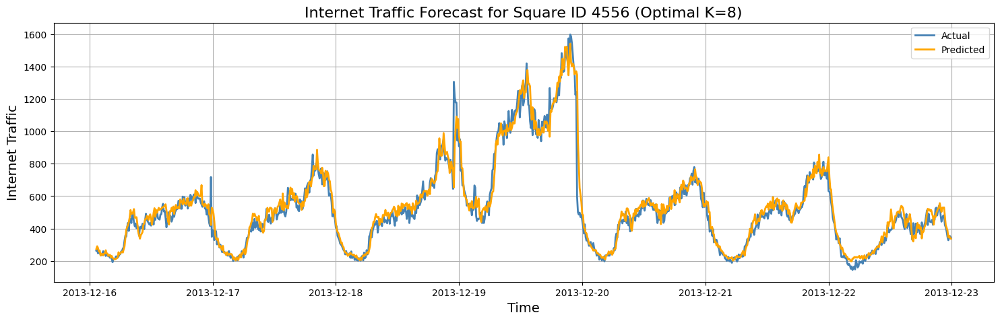

In [6]:
# Parameters
square_ids = [5161, 4159, 4556]
train_end_date = '2013-12-15 23:59:59'
forecast_start_date = '2013-12-16 00:00:00'
forecast_end_date = '2013-12-22 23:59:59'
k_values = range(1, 21)  # Range of K values to test

# Ensure time_interval is in datetime format
df['time_interval'] = pd.to_datetime(df['time_interval'])

# Define the KNN forecaster with hyperparameter tuning for optimal K
def knn_forecaster(df, square_id, train_end_date, forecast_start_date, forecast_end_date, k_values):
    # Filter data for the specific square_id
    square_data = df[df['square_id'] == square_id]

    # Split data into train and test based on provided dates
    train_data = square_data[square_data['time_interval'] <= pd.to_datetime(train_end_date)]
    test_data = square_data[(square_data['time_interval'] >= pd.to_datetime(forecast_start_date)) &
                            (square_data['time_interval'] <= pd.to_datetime(forecast_end_date))]

    # Set time_interval as the index for time series modeling
    train_data.set_index('time_interval', inplace=True)
    test_data.set_index('time_interval', inplace=True)

    # Prepare the training data for KNN: We use the last 'k' time steps to predict the next step
    def create_lagged_features(data, k):
        X, y = [], []
        for i in range(k, len(data)):
            X.append(data[i-k:i].values)  # Features: last 'k' observations
            y.append(data[i])  # Target: the next time step
        return np.array(X), np.array(y)

    # Store results for each K
    results = {}

    # Loop over each K value to find the optimal number of neighbors
    for k in k_values:
        # Create lagged features for the current K
        X_train, y_train = create_lagged_features(train_data['internet_traffic'], k)
        X_test, y_test = create_lagged_features(test_data['internet_traffic'], k)

        # Initialize and train the KNN model
        knn_model = KNeighborsRegressor(n_neighbors=k)
        knn_model.fit(X_train, y_train)

        # Make predictions on the test set
        forecast = knn_model.predict(X_test)

        # Evaluate the predictions
        mae = mean_absolute_error(y_test, forecast)
        mape = mean_absolute_percentage_error(y_test, forecast)

        # Store the MAE and MAPE for this value of K
        results[k] = {'MAE': mae, 'MAPE': mape}

    # Find the K with the lowest MAE
    best_k = min(results, key=lambda x: results[x]['MAE'])
    best_mae = results[best_k]['MAE']
    best_mape = results[best_k]['MAPE']

    print(f"Optimal K for Square ID {square_id}: {best_k}")
    print(f"MAE: {best_mae}")
    print(f"MAPE: {best_mape * 100}%")

    # Plot actual vs. predicted values using the best K
    X_train, y_train = create_lagged_features(train_data['internet_traffic'], best_k)
    X_test, y_test = create_lagged_features(test_data['internet_traffic'], best_k)
    knn_model = KNeighborsRegressor(n_neighbors=best_k)
    knn_model.fit(X_train, y_train)
    forecast = knn_model.predict(X_test)

    plt.figure(figsize=(18, 5))
    plt.plot(test_data.index[best_k:], y_test, label='Actual', color='steelblue', linewidth=2)
    plt.plot(test_data.index[best_k:], forecast, label='Predicted', color='orange', linewidth=2)
    plt.title(f"Internet Traffic Forecast for Square ID {square_id} (Optimal K={best_k})", fontsize=16)
    plt.xlabel("Time", fontsize=14)
    plt.ylabel("Internet Traffic", fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the forecaster for each specified square_id
for square_id in square_ids:
    knn_forecaster(df, square_id, train_end_date, forecast_start_date, forecast_end_date, k_values)
